# INTRODUCTION

## A brief background
According to the house pricing statistics of UK , London is one of the most expensive places to live in.The real estate business is on a short fall due to the decreased number of house purchases in the recent decade , especially in the past 5 years.According to a 2018 census report , more and more residents in UK and especially in London are opting to rent out condominiums and apartments(60%) .These rank highest in rental and purchases , causing a downfall in purchase of homes for families.The increased pricing might not subdue owing to the prospect of higher taxes and a warning from the Bank of England that U.K. home values could fall as much as 30 percent in the event of a disorderly exit from the European Union causing real estaters to back out. More specifically, four overlooked cracks suggest that the London market may be in worse shape than many realize: hidden price falls, record-low sales, homebuilder exodus and tax hikes addressing overseas buyers of homes in England and Wales.

### Target audience:
There are many families longing to buy their own homes , but with the increasing dilemma of unaffordable house pricing , these real estate clientele have to opt out of their housing preference with a different place to call their "home".Thus this project aims to help resolve this issue for anyone trying to buy a home in London and to real estaters who can help suggest good residential plots.

### Business problem :
The question at hand is Are there medium priced houses available for purchase in London? if so , is the construction sound or compromised in lieu with the minimal cost.Are there houses available in good localities with access to amenities such as hospitals , gyms , schools etc.All in all the project aims at rendering support to those interested in buying their own homes,to help the make wise and effective decisions under ongoing financial and economic constraints.


## Data Section

### Data Description
In this section a brief overview of the data used for the case study is given.In order to get a comprehensive understanding of the question or the business problem posed, it is necessary to obtain a clear understanding of the situations that influence the problem.The data chosen to work on was obatained from http://landregistry.data.gov.uk/ -website containing informtion on UK real estate , house pricing and registries.Cross referencing was also done with various websites to obatin any readily available information on housing prices and prefences , a list of which has been provided below.
1. https://www.testbig.com/ielts-writing-task-i-essays/chart-illustrates-housing-preferences-among-people-who-lived-british
2. https://www.homesandproperty.co.uk/property-news/buying/the-best-areas-to-start-your-search-for-a-family-house-with-good-links-to-the-city-a116886.html
3. https://www.zoopla.co.uk/discover/first-time-buyers/london/#4jJFWixLL2Hl0cuD.97



The land registry data contains information regarding all housing registries made in the UK.It comprises of columns containing unique id,price of house purchased,date of purchase,address(street,city,district)info,age of housing and pin codes.However , the tabular data imported will have to be preprocessed as per the scope of this case study.
Since,the business problem is associated only with London , London specific data must be filtered out from the data set and unnecessary data must be dropped.

In order understand the pricing affordability of customers , data regarding buying trends in first time home buyers is observed to get an approximation of mean price preference.

Leveraging the use of Foursquare API, folium and geopy in order to obtain location data and venues in the vicinity of our target areas is done to increase the probability of suggesting a good locality with suitable amenities.The data will be clustered using K-means clustering , a machine learning algorithm used to group similar patterns together.This would help in recoomending locations based on customers with similar or specific prefernces.

### Data accumulation to solve the business problem:
1. House purchase real estate record data of UK from which a list of london streets and their corresponding average purchase prices can be obtained.
2. Average house costing data in Greater London to get an avergae price estimate that we are looking for
3. geopy to obtain geographic coordinates for visualization
3. Foursquare API to obtain venues near each of the localities
4. Folium map to mark and observe the neighbourhoods

The average purchase price for a first time buyer in Greater and Central London is around £509,047 while in South East London it costs around  £339,510.Let us take a look at the data set of some of the cheapest housings in Greater London.


In [4]:
#importing necessary libraries to scrape web data
from bs4 import BeautifulSoup 
from urllib.request import urlopen as uReq
import requests
import lxml
import pandas as pd
from pandas import DataFrame
import numpy as np

In [9]:
#importing a csv dataset from (https://www.zoopla.co.uk/discover/first-time-buyers/london/#4jJFWixLL2Hl0cuD.97)
# obtaining the url

url = 'https://www.zoopla.co.uk/discover/first-time-buyers/london/#4jJFWixLL2Hl0cuD.97'
pricedata = requests.get(url).text
transdata = BeautifulSoup(pricedata, 'html.parser')

In [11]:
data = []
for tr in transdata.tbody.find_all('tr'):
    data.append([ td.get_text().strip() for td in tr.find_all('td')])
df = pd.DataFrame(data, columns=['PostCode','Area','Average House price','Average deposit required','Average household income required'])
df.head(10)

,PostCode,Area,Average House price,Average deposit required,Average household income required
0,Postcode,Area,Average house price,Average deposit required,Average household income required
1,DA18,Erith,"£173,609","£43,177","£32,608"
2,DA8,Erith,"£242,668","£60,352","£45,579"
3,DA17,Belvedere,"£243,193","£60,482","£45,678"
4,IG11,Barking,"£245,019","£60,936","£46,021"
5,RM6,Romford,"£249,221","£61,981","£46,810"
6,RM5,Romford,"£261,202","£64,961","£49,060"
7,UB1,Southall,"£261,245","£64,972","£49,068"
8,IG3,Ilford,"£262,274","£65,228","£49,262"
9,EN3,Enfield,"£263,694","£65,581","£49,528"


In [13]:
df.drop([0],axis=0,inplace=True)

In [14]:
df.head()

,PostCode,Area,Average House price,Average deposit required,Average household income required
1,DA18,Erith,"£173,609","£43,177","£32,608"
2,DA8,Erith,"£242,668","£60,352","£45,579"
3,DA17,Belvedere,"£243,193","£60,482","£45,678"
4,IG11,Barking,"£245,019","£60,936","£46,021"
5,RM6,Romford,"£249,221","£61,981","£46,810"


In [37]:
df['Average House price'].str.replace('£','')

1     173,609
2     242,668
3     243,193
4     245,019
5     249,221
6     261,202
7     261,245
8     262,274
9     263,694
10    264,615
Name: Average House price, dtype: object

In [34]:
df['Average House price'].mean()
df['Average House price']

From the above table it can be observed that the average price of some of the well known localities in greater London , one of the most expensive of places,is £2,202,125 and can be used as our base assumption to figure out localities.So let us take a round range from  £2,000,000 to £3,000,000.Thus let us identify the localities offering this pricing range and the venues around them.

## Data Preprocessing

The London data set must be obtained from preprocessing the UK real estate data imported through the below following procceses.

In [1]:
import numpy as np # library to handle data in a vectorized manner
import time
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe


!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
import folium # map rendering library
from folium import plugins

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

import seaborn as sns

# import k-means from clustering stage
from sklearn.cluster import KMeans



print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2019.9.11          |           py36_0         147 KB  conda-forge
    ca-certificates-2019.9.11  |       hecc5488_0         144 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    openssl-1.1.1d             |       h516909a_0         2.1 MB  conda-forge
    geopy-1.20.0               |             py_0          57 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0         conda-forge
    geopy:           1.20.0-py_0       conda-forge

The following packages will be UPDATED:

    cer

In [2]:
#importing basic essential data
prop_data = pd.read_csv("http://prod2.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com/pp-2018.csv",header=None)
prop_data.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,{79A74E21-D11E-1289-E053-6B04A8C01627},770000,2018-09-25 00:00,SK7 1AR,D,N,F,5,NaN,OAK MEADOW,BRAMHALL,STOCKPORT,STOCKPORT,GREATER MANCHESTER,A,A
1,{79A74E21-D11F-1289-E053-6B04A8C01627},253500,2018-09-24 00:00,M6 8GQ,D,N,F,1,NaN,RIVINGTON ROAD,NaN,SALFORD,SALFORD,GREATER MANCHESTER,A,A
2,{79A74E21-D120-1289-E053-6B04A8C01627},231950,2018-09-28 00:00,WA3 2UE,D,Y,F,35,NaN,STONEACRE CLOSE,LOWTON,WARRINGTON,WIGAN,GREATER MANCHESTER,A,A
3,{79A74E21-D121-1289-E053-6B04A8C01627},112500,2018-08-29 00:00,OL6 6RJ,S,N,F,102,NaN,THORNFIELD GROVE,NaN,ASHTON-UNDER-LYNE,TAMESIDE,GREATER MANCHESTER,A,A
4,{79A74E21-D122-1289-E053-6B04A8C01627},184995,2018-06-15 00:00,M46 0TW,S,Y,F,37,NaN,THREADNEEDLE PLACE,ATHERTON,MANCHESTER,WIGAN,GREATER MANCHESTER,A,A
5,{79A74E21-D123-1289-E053-6B04A8C01627},214995,2018-09-28 00:00,M28 3XS,D,Y,L,9,NaN,MARPLE GARDENS,WORSLEY,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
6,{79A74E21-D124-1289-E053-6B04A8C01627},378000,2018-09-21 00:00,M45 7QN,D,N,L,36,NaN,HILLINGDON ROAD,WHITEFIELD,MANCHESTER,MANCHESTER,GREATER MANCHESTER,A,A
7,{79A74E21-D125-1289-E053-6B04A8C01627},272500,2018-05-25 00:00,WN6 0GQ,D,Y,L,11,NaN,HEDGEBANK,STANDISH,WIGAN,WIGAN,GREATER MANCHESTER,A,A
8,{79A74E21-D127-1289-E053-6B04A8C01627},169950,2018-09-20 00:00,WN6 0ZJ,S,Y,F,50,NaN,FOXTAIL MEADOW,STANDISH,WIGAN,WIGAN,GREATER MANCHESTER,A,A
9,{79A74E21-D128-1289-E053-6B04A8C01627},260995,2018-08-30 00:00,WN6 0UU,D,Y,F,49,NaN,STABLEFORD CLOSE,STANDISH,WIGAN,WIGAN,GREATER MANCHESTER,A,A


In [3]:
#infering a basic idea of the data
prop_data.dtypes #obtaining data types incase conversions are necessary

0     object
1      int64
2     object
3     object
4     object
5     object
6     object
7     object
8     object
9     object
10    object
11    object
12    object
13    object
14    object
15    object
dtype: object

In [4]:
prop_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025511 entries, 0 to 1025510
Data columns (total 16 columns):
0     1025511 non-null object
1     1025511 non-null int64
2     1025511 non-null object
3     1019598 non-null object
4     1025511 non-null object
5     1025511 non-null object
6     1025511 non-null object
7     1025511 non-null object
8     140720 non-null object
9     1005833 non-null object
10    386475 non-null object
11    1025511 non-null object
12    1025507 non-null object
13    1025511 non-null object
14    1025511 non-null object
15    1025511 non-null object
dtypes: int64(1), object(15)
memory usage: 125.2+ MB


In [5]:
prop_data.shape # obtaining the dimensions of the data set(rows and columns)

(1025511, 16)

In [6]:
#renaming the columns into interpreatble attributes
headers=['ID','Price','Date','PostalCode','PropType','PropOldNew','Duration','PAON','SAON','Street','Locality','Town','District','Country','PPD_Type','Record_Status']

In [7]:
prop_data.columns=headers
prop_data.head()

,ID,Price,Date,PostalCode,PropType,PropOldNew,Duration,PAON,SAON,Street,Locality,Town,District,Country,PPD_Type,Record_Status
0,{79A74E21-D11E-1289-E053-6B04A8C01627},770000,2018-09-25 00:00,SK7 1AR,D,N,F,5,NaN,OAK MEADOW,BRAMHALL,STOCKPORT,STOCKPORT,GREATER MANCHESTER,A,A
1,{79A74E21-D11F-1289-E053-6B04A8C01627},253500,2018-09-24 00:00,M6 8GQ,D,N,F,1,NaN,RIVINGTON ROAD,NaN,SALFORD,SALFORD,GREATER MANCHESTER,A,A
2,{79A74E21-D120-1289-E053-6B04A8C01627},231950,2018-09-28 00:00,WA3 2UE,D,Y,F,35,NaN,STONEACRE CLOSE,LOWTON,WARRINGTON,WIGAN,GREATER MANCHESTER,A,A
3,{79A74E21-D121-1289-E053-6B04A8C01627},112500,2018-08-29 00:00,OL6 6RJ,S,N,F,102,NaN,THORNFIELD GROVE,NaN,ASHTON-UNDER-LYNE,TAMESIDE,GREATER MANCHESTER,A,A
4,{79A74E21-D122-1289-E053-6B04A8C01627},184995,2018-06-15 00:00,M46 0TW,S,Y,F,37,NaN,THREADNEEDLE PLACE,ATHERTON,MANCHESTER,WIGAN,GREATER MANCHESTER,A,A


Formating the date column to sort data as per date , taking into consideration only recent transactions after 2016

In [8]:
# as observed we will need to change the data type of certain attributes
#let us format the date column
prop_data['Date']=prop_data['Date'].apply(pd.to_datetime)


In [9]:
import datetime as dt
#considering relevant transactions in the past 3 years
# drop transactions before 2016
prop_data.drop(prop_data[prop_data.Date.dt.year<2016].index,inplace=True)

In [10]:
#sort values based on date
prop_data.sort_values(by='Date',ascending=False,inplace=True)
prop_data.head(20)

,ID,Price,Date,PostalCode,PropType,PropOldNew,Duration,PAON,SAON,Street,Locality,Town,District,Country,PPD_Type,Record_Status
978511,{8CAC1319-04BB-0253-E053-6B04A8C08E51},317791,2018-12-31,HR3 6NS,O,N,F,THE OLD SAWMILLS,UNIT 4,NaN,EARDISLEY,HEREFORD,HEREFORDSHIRE,HEREFORDSHIRE,B,A
687638,{919FEC05-D1B3-9A90-E053-6C04A8C0A300},2410000,2018-12-31,SW11 3AD,F,N,L,WILLIAM BLAKE HOUSE,FLAT 4,BRIDGE LANE,NaN,LONDON,WANDSWORTH,GREATER LONDON,A,A
979285,{8F1B26BE-94F7-53DB-E053-6C04A8C03649},500000,2018-12-31,PE25 1QU,O,N,L,1,NaN,LABURNUM AVENUE,ROMAN BANK,SKEGNESS,EAST LINDSEY,LINCOLNSHIRE,B,A
973673,{80E1AA99-07CA-7BF8-E053-6C04A8C00BF2},30000,2018-12-31,PO36 8QR,O,N,L,7,NaN,SANDOWN BAY HOLIDAY CENTRE,NaN,SANDOWN,ISLE OF WIGHT,ISLE OF WIGHT,B,A
970183,{80E1AA99-1291-7BF8-E053-6C04A8C00BF2},530000,2018-12-31,NR20 3LR,O,N,F,THE BARNS,NaN,MATTISHALL ROAD,EAST TUDDENHAM,DEREHAM,BRECKLAND,NORFOLK,B,A
1007200,{8A78B2B0-5C5F-5CB0-E053-6B04A8C0F504},484486,2018-12-31,BS37 5AH,O,N,F,APOLLO PARK,UNIT 2,ARMSTRONG WAY,YATE,BRISTOL,SOUTH GLOUCESTERSHIRE,SOUTH GLOUCESTERSHIRE,B,A
126924,{85866A64-DF5D-143F-E053-6B04A8C06A15},57000,2018-12-31,FY1 6BS,T,N,F,29,NaN,CRYSTAL ROAD,NaN,BLACKPOOL,BLACKPOOL,BLACKPOOL,A,A
147430,{8355F008-D73F-55C5-E053-6B04A8C0D090},232950,2018-12-31,PL7 1AP,S,Y,F,28,NaN,WARELWAST CLOSE,NaN,PLYMOUTH,CITY OF PLYMOUTH,CITY OF PLYMOUTH,A,A
147452,{8355F008-D75F-55C5-E053-6B04A8C0D090},227500,2018-12-31,PL9 8FX,T,Y,F,36,NaN,DORADO STREET,SHERFORD,PLYMOUTH,SOUTH HAMS,DEVON,A,A
1007199,{8A78B2B0-5C5E-5CB0-E053-6B04A8C0F504},575650,2018-12-31,BS37 5AH,O,N,F,APOLLO PARK,UNIT 1,ARMSTRONG WAY,YATE,BRISTOL,SOUTH GLOUCESTERSHIRE,SOUTH GLOUCESTERSHIRE,B,A


In [11]:
prop_data.tail()

,ID,Price,Date,PostalCode,PropType,PropOldNew,Duration,PAON,SAON,Street,Locality,Town,District,Country,PPD_Type,Record_Status
888181,{64342BFE-6A85-422C-E053-6C04A8C0FB8A},170000,2018-01-01,PE20 2NR,D,N,F,TWO HOOTS,NaN,SLEAFORD ROAD,WIGTOFT,BOSTON,BOSTON,LINCOLNSHIRE,A,A
665295,{68FEB20B-A0AB-38DA-E053-6C04A8C051AE},112000,2018-01-01,LN11 9HZ,T,N,F,39,NaN,TENNYSON ROAD,NaN,LOUTH,EAST LINDSEY,LINCOLNSHIRE,A,A
176491,{6DA0844A-997C-30F2-E053-6B04A8C05F3B},95000,2018-01-01,BD13 4JA,S,N,F,45,NaN,HILL CREST ROAD,DENHOLME,BRADFORD,BRADFORD,WEST YORKSHIRE,A,A
921583,{64342BFF-5F7E-422C-E053-6C04A8C0FB8A},1339975,2018-01-01,YO11 3DX,O,N,F,U P M RAFLATAC LTD,NaN,WAREHAM ROAD,EASTFIELD,SCARBOROUGH,SCARBOROUGH,NORTH YORKSHIRE,B,A
628029,{64342BFE-C1B7-422C-E053-6C04A8C0FB8A},335000,2018-01-01,DA1 4PZ,S,N,F,40,NaN,MAYPLACE AVENUE,CRAYFORD,DARTFORD,BEXLEY,GREATER LONDON,A,A


Creating a new dataframe containing data relevant only to London

In [12]:
#obtaining data with london as a value
london_df = prop_data.query("Town=='LONDON'")



In [13]:
#obtaining streets specific to london as a list
london_streets = london_df['Street'].unique().tolist()

Obtaining the average price of hosuing in each street so that we can filter it as per our base range

In [14]:
#let us obtain the average pricing using mean()
lon_mean_price= london_df.groupby(['Street'])['Price'].mean().reset_index()

#adding necessary columns to the dataframe
lon_mean_price.columns=['Locality','Avg_Price']

In [15]:
lon_mean_price.head()

,Locality,Avg_Price
0,AARON HILL ROAD,295000.0
1,ABBERLEY MEWS,500000.0
2,ABBESS CLOSE,265000.0
3,ABBEVILLE ROAD,1365460.0
4,ABBEY GARDENS,2767950.0


Filtering out streets within our price range of 2,000,000 to 3,000,000 to help people who could afford the budget range and well above it.

Creating a new data frame called affordable price containing only street and average price value to which geographical coordinates of each street will later be concatenated.

In [16]:
#the average pricing of many localities seems to be pretty unnafordable
#let us limit the range to an affordable range
affordable_price = lon_mean_price.query("(Avg_Price>=2000000)&(Avg_Price<=3000000)")

In [17]:
affordable_price.head()

,Locality,Avg_Price
4,ABBEY GARDENS,2767950.0
13,ABBEY TRADING POINT,3000000.0
51,ABINGDON VILLAS,2816000.0
118,ADMIRAL SQUARE,2700000.0
138,AINGER ROAD,2787500.0


In [18]:
affordable_price.describe()

,Avg_Price
count,4.140000e+02
mean,2.424136e+06
std,2.826546e+05
min,2.000000e+06
25%,2.191726e+06
50%,2.399722e+06
75%,2.641250e+06
max,3.000000e+06


•	From the pricing statistics , it can be observed that 50% of the localities have  a mean price of 2,400,000 pounds and a major 75% make up for a price value of 2,650,000 pounds which is a good price representative range.

In [19]:
affordable_price.shape

(414, 2)

In [20]:
import os
import pandas as pd
import numpy as np
import datetime as DT
import hmac
from geopy.geocoders import Nominatim
from geopy.distance import vincenty
# import k-means from clustering stage
from sklearn.cluster import KMeans

In [21]:
#indexing items for visualization
for index, item in affordable_price.iterrows():
    print(f"index: {index}")
    print(f"item: {item}")
    print(f"item.Street only: {item.Locality}")

index: 4
item: Locality     ABBEY GARDENS
Avg_Price      2.76795e+06
Name: 4, dtype: object
item.Street only: ABBEY GARDENS
index: 13
item: Locality     ABBEY TRADING POINT
Avg_Price                  3e+06
Name: 13, dtype: object
item.Street only: ABBEY TRADING POINT
index: 51
item: Locality     ABINGDON VILLAS
Avg_Price          2.816e+06
Name: 51, dtype: object
item.Street only: ABINGDON VILLAS
index: 118
item: Locality     ADMIRAL SQUARE
Avg_Price           2.7e+06
Name: 118, dtype: object
item.Street only: ADMIRAL SQUARE
index: 138
item: Locality     AINGER ROAD
Avg_Price     2.7875e+06
Name: 138, dtype: object
item.Street only: AINGER ROAD
index: 146
item: Locality     AIREDALE AVENUE
Avg_Price         2.0225e+06
Name: 146, dtype: object
item.Street only: AIREDALE AVENUE
index: 196
item: Locality     ALBION SQUARE
Avg_Price         2.45e+06
Name: 196, dtype: object
item.Street only: ALBION SQUARE
index: 197
item: Locality     ALBION STREET
Avg_Price      2.09667e+06
Name: 197, dty

Obtaining the geographical coordinates for all streets in our affordable price list to be able to visualize the data.

In [22]:
from geopy.extra.rate_limiter import RateLimiter
locator = Nominatim(user_agent="myGeocoder")
geocode = RateLimiter(locator.geocode, min_delay_seconds=1)
affordable_price['locality'] = affordable_price['Locality'].apply(geocode)
affordable_price['CityCoords'] = affordable_price['locality'].apply(lambda loc: tuple(loc.point) if loc else None)

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [23]:
affordable_price.head()

,Locality,Avg_Price,locality,CityCoords
4,ABBEY GARDENS,2767950.0,"(Abbey Gardens, Kirkstall, Leeds, Yorkshire an...","(53.81877655, -1.60767235427371, 0.0)"
13,ABBEY TRADING POINT,3000000.0,"(Abbey, Rue Grellier, Rue des Pres Trading Est...","(49.18179205, -2.07997384418976, 0.0)"
51,ABINGDON VILLAS,2816000.0,"(Abingdon Villas, Earl's Court, Royal Borough ...","(51.4979279, -0.1948568, 0.0)"
118,ADMIRAL SQUARE,2700000.0,"(Admiral Square, Chelsea Harbour, Sands End, L...","(51.4762442, -0.1801569, 0.0)"
138,AINGER ROAD,2787500.0,"(Ainger Road, Swiss Cottage, Chalk Farm, Londo...","(51.5411992, -0.1588228, 0.0)"


In [24]:
affordable_price[['latitude', 'longitude','altitude']] = pd.DataFrame(affordable_price['CityCoords'].tolist(), index=affordable_price.index)
affordable_price.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


,Locality,Avg_Price,locality,CityCoords,latitude,longitude,altitude
4,ABBEY GARDENS,2767950.0,"(Abbey Gardens, Kirkstall, Leeds, Yorkshire an...","(53.81877655, -1.60767235427371, 0.0)",53.818777,-1.607672,0.0
13,ABBEY TRADING POINT,3000000.0,"(Abbey, Rue Grellier, Rue des Pres Trading Est...","(49.18179205, -2.07997384418976, 0.0)",49.181792,-2.079974,0.0
51,ABINGDON VILLAS,2816000.0,"(Abingdon Villas, Earl's Court, Royal Borough ...","(51.4979279, -0.1948568, 0.0)",51.497928,-0.194857,0.0
118,ADMIRAL SQUARE,2700000.0,"(Admiral Square, Chelsea Harbour, Sands End, L...","(51.4762442, -0.1801569, 0.0)",51.476244,-0.180157,0.0
138,AINGER ROAD,2787500.0,"(Ainger Road, Swiss Cottage, Chalk Farm, Londo...","(51.5411992, -0.1588228, 0.0)",51.541199,-0.158823,0.0


Creating a flitered out data frame called new_df which will further be used for clustering and visualization.

In [25]:
new_df = affordable_price.drop(columns=['locality','CityCoords','altitude'])
new_df.head()

,Locality,Avg_Price,latitude,longitude
4,ABBEY GARDENS,2767950.0,53.818777,-1.607672
13,ABBEY TRADING POINT,3000000.0,49.181792,-2.079974
51,ABINGDON VILLAS,2816000.0,51.497928,-0.194857
118,ADMIRAL SQUARE,2700000.0,51.476244,-0.180157
138,AINGER ROAD,2787500.0,51.541199,-0.158823


In [26]:
address = 'London, UK'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London City are {}, {}.'.format(latitude,longitude))

The geograpical coordinate of London City are 51.5073219, -0.1276474.


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.20.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  app.launch_new_instance()


#  Folium

In [27]:
# create a folium map of london with markers
lon_map = folium.Map(location=[latitude,longitude],zoom_start=12)

#markers
for lat,lng,price,street in zip(new_df['latitude'],new_df['longitude'],new_df['Avg_Price'],new_df['Locality']):
    label = '{}, {}'.format(street, price)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(lon_map)  
lon_map

#  Foursquare API

Using Foursquare API to obtain and explore venues in the vicinity of each street to help dtermine best housing neighbourhoods

In [28]:
#using foursquare data to analyze thw neighbourhood
CLIENT_ID = '3BB2GRSUOKBN0PQPEFKIDY5KNPRIGVEMSJUSOQ3ASCBCFMJA' # your Foursquare ID
CLIENT_SECRET = 'XN15JSFRMFSHML345UXMCVVTWBDHLY2TS3G2WKFNPHA0SVWX' # your Foursquare Secret
VERSION = '20180604'
#LIMIT = 100
#radius =1000
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3BB2GRSUOKBN0PQPEFKIDY5KNPRIGVEMSJUSOQ3ASCBCFMJA
CLIENT_SECRET:XN15JSFRMFSHML345UXMCVVTWBDHLY2TS3G2WKFNPHA0SVWX


In [29]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Street', 
                  'Street Latitude', 
                  'Street Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)           

In [ ]:
location_venues = getNearbyVenues(names=new_df['Locality'],
                                   latitudes=new_df['latitude'],
                                   longitudes=new_df['longitude']
                                  )

#location_venues  extremely long


In [ ]:
#group the venues by street
location_venues.groupby('Street').count()  #table too long can execute separately

In [205]:
print('There are {} uniques categories.'.format(len(location_venues['Venue Category'].unique())))

There are 409 uniques categories.


# Methodology

In the data section we have:
1. preprocessed necessary data
2. Obtained average pricing of various streets in London
3. Visualized the neighbourhoods that will be used in analysis using Folium
4. Obtained a list of venues in the range of each street.

Now that all the necessary data has been obtained, the data must be co-incorporated to draw meaningful results.
In the methodology section let us further leverage foursquare and other tools to :
1. To obtain the highest frequency of a venue in each locality
2. To obtain the top 10 venues in each locality
3. To cluster similar localities through a machine learning technique called k-means clustering in order to draw out similarities and dissimilarities and to identify the best cluster with cost effective houing.

### Obtaining the most frequently occuring venues in each locality

In [206]:
# one hot encoding
venues_onehot = pd.get_dummies(location_venues[['Venue Category']], prefix="", prefix_sep="")

# add street column back to dataframe
venues_onehot['Street'] = location_venues['Street'] 

# move street column to the first column
fixed_columns = [venues_onehot.columns[-1]] + list(venues_onehot.columns[:-1])

#fixed_columns
venues_onehot = venues_onehot[fixed_columns]

venues_onehot.head()

,Street,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Bathing Area,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Bowling Green,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Campground,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Cafeteria,College Hockey Rink,College Quad,College Residence Hall,Comedy Club,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Doner Restaurant,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Friterie,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Hill,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Event Space,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Paella Restaurant,Pakistani Restaurant,Palace,P

In [207]:
lon_grouped = venues_onehot.groupby('Street').mean().reset_index()
lon_grouped

,Street,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Bathing Area,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Bowling Green,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Campground,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Cafeteria,College Hockey Rink,College Quad,College Residence Hall,Comedy Club,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Doner Restaurant,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Friterie,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Hill,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Event Space,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Paella Restaurant,Pakistani Restaurant,Palace,P

In [179]:
num_top_venues = 5 #top 5 venues

for hood in lon_grouped['Street']:
    print("----"+hood+"----")
    temp = lon_grouped[lon_grouped['Street'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ABBEY GARDENS----
            venue  freq
0             Pub  0.15
1    Outlet Store  0.08
2  History Museum  0.08
3   Historic Site  0.08
4     Supermarket  0.08


----ABBEY TRADING POINT----
                   venue  freq
0            Supermarket   0.5
1                  Hotel   0.5
2      Accessories Store   0.0
3  Outdoors & Recreation   0.0
4           Perfume Shop   0.0


----ABINGDON VILLAS----
                venue  freq
0                Café  0.06
1  Italian Restaurant  0.06
2              Bakery  0.05
3                 Pub  0.05
4               Hotel  0.05


----ADMIRAL SQUARE----
                venue  freq
0               Hotel  0.08
1  Italian Restaurant  0.08
2                 Pub  0.08
3          Restaurant  0.04
4                Café  0.04


----AINGER ROAD----
                venue  freq
0                 Pub  0.13
1                Café  0.10
2         Coffee Shop  0.10
3  Italian Restaurant  0.06
4                 Spa  0.03


----AIREDALE AVENUE----
               

In [208]:
# Define a function to return the most common venues/facilities nearby real estate investments#

def most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [209]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Street']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

In [211]:
# create a new dataframe
venues_sorted = pd.DataFrame(columns=columns)
venues_sorted['Street'] = lon_grouped['Street']

for ind in np.arange(lon_grouped.shape[0]):
    venues_sorted.iloc[ind, 1:] = most_common_venues(lon_grouped.iloc[ind, :], num_top_venues)

In [183]:
venues_sorted.head()

,Street,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ABBEY GARDENS,Pub,Historic Site,Deli / Bodega,Outlet Store,Coffee Shop,History Museum,Discount Store,Supermarket,Pet Store,Optical Shop
1,ABBEY TRADING POINT,Supermarket,Hotel,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory
2,ABINGDON VILLAS,Café,Italian Restaurant,Hotel,Bakery,Pub,Modern European Restaurant,Sushi Restaurant,Garden,Cupcake Shop,Burger Joint
3,ADMIRAL SQUARE,Pub,Hotel,Italian Restaurant,Restaurant,Spa,Café,Furniture / Home Store,Modern European Restaurant,Gastropub,Middle Eastern Restaurant
4,AINGER ROAD,Pub,Café,Coffee Shop,Italian Restaurant,Asian Restaurant,Furniture / Home Store,Scenic Lookout,Park,Market,Greek Restaurant


In [213]:
lon_grouped=new_df
lon_grouped.head()

,Locality,Avg_Price,latitude,longitude,Cluster Labels
4,ABBEY GARDENS,2767950.0,53.818777,-1.607672,1
13,ABBEY TRADING POINT,3000000.0,49.181792,-2.079974,3
51,ABINGDON VILLAS,2816000.0,51.497928,-0.194857,3
118,ADMIRAL SQUARE,2700000.0,51.476244,-0.180157,1
138,AINGER ROAD,2787500.0,51.541199,-0.158823,3


In [77]:
df1 = affordable_price.copy()

In [78]:
df1['Coordinates']= list(zip(affordable_price.latitude,affordable_price.longitude))

In [79]:
df1.head()

,Locality,Avg_Price,locality,CityCoords,latitude,longitude,altitude,Coordinates
4,ABBEY GARDENS,2767950.0,"(Abbey Gardens, Kirkstall, Leeds, Yorkshire an...","(53.81877655, -1.60767235427371, 0.0)",53.818777,-1.607672,0.0,"(53.81877655, -1.60767235427371)"
13,ABBEY TRADING POINT,3000000.0,"(Abbey, Rue Grellier, Rue des Pres Trading Est...","(49.18179205, -2.07997384418976, 0.0)",49.181792,-2.079974,0.0,"(49.18179205, -2.07997384418976)"
51,ABINGDON VILLAS,2816000.0,"(Abingdon Villas, Earl's Court, Royal Borough ...","(51.4979279, -0.1948568, 0.0)",51.497928,-0.194857,0.0,"(51.4979279, -0.1948568)"
118,ADMIRAL SQUARE,2700000.0,"(Admiral Square, Chelsea Harbour, Sands End, L...","(51.4762442, -0.1801569, 0.0)",51.476244,-0.180157,0.0,"(51.4762442, -0.1801569)"
138,AINGER ROAD,2787500.0,"(Ainger Road, Swiss Cottage, Chalk Farm, Londo...","(51.5411992, -0.1588228, 0.0)",51.541199,-0.158823,0.0,"(51.5411992, -0.1588228)"


In [34]:
df1.drop(columns=(['locality','CityCoords','latitude','longitude','altitude']),axis=1,inplace=True)

In [97]:
df1['new_col'] = df1.index

In [98]:
df1.head()

,Locality,Avg_Price,locality,CityCoords,latitude,longitude,altitude,Coordinates,new_col
4,ABBEY GARDENS,2767950.0,"(Abbey Gardens, Kirkstall, Leeds, Yorkshire an...","(53.81877655, -1.60767235427371, 0.0)",53.818777,-1.607672,0.0,"(53.81877655, -1.60767235427371)",4
13,ABBEY TRADING POINT,3000000.0,"(Abbey, Rue Grellier, Rue des Pres Trading Est...","(49.18179205, -2.07997384418976, 0.0)",49.181792,-2.079974,0.0,"(49.18179205, -2.07997384418976)",13
51,ABINGDON VILLAS,2816000.0,"(Abingdon Villas, Earl's Court, Royal Borough ...","(51.4979279, -0.1948568, 0.0)",51.497928,-0.194857,0.0,"(51.4979279, -0.1948568)",51
118,ADMIRAL SQUARE,2700000.0,"(Admiral Square, Chelsea Harbour, Sands End, L...","(51.4762442, -0.1801569, 0.0)",51.476244,-0.180157,0.0,"(51.4762442, -0.1801569)",118
138,AINGER ROAD,2787500.0,"(Ainger Road, Swiss Cottage, Chalk Farm, Londo...","(51.5411992, -0.1588228, 0.0)",51.541199,-0.158823,0.0,"(51.5411992, -0.1588228)",138


In [81]:
df1.index = df1.index.astype(str)

In [82]:

df1.Avg_Price = df1.Avg_Price.astype(str)

In [83]:
df1.dtypes

Locality        object
Avg_Price       object
locality        object
CityCoords      object
latitude       float64
longitude      float64
altitude       float64
Coordinates     object
dtype: object

As we can observe , it would make more sense to look at categories on the whole.Let us take a look into the general or main categories instead of the sub categories.

In [84]:
categories_url = 'https://api.foursquare.com/v2/venues/categories?client_id={}&client_secret={}&v={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
            
# make the GET request
results = requests.get(categories_url).json()

In [85]:
len(results['response']['categories'])

10

Obtaining the main categories and their respective category ID from foursquare

In [86]:
categories_list = []
# Let's print only the top-level categories and their IDs and also add them to categories_list

def print_categories(categories, level=0, max_level=0):    
    if level>max_level: return
    out = ''
    out += '-'*level
    for category in categories:
        print(out + category['name'] + ' (' + category['id'] + ')')
        print_categories(category['categories'], level+1, max_level)
        categories_list.append((category['name'], category['id']))
        
print_categories(results['response']['categories'], 0, 0)

Arts & Entertainment (4d4b7104d754a06370d81259)
College & University (4d4b7105d754a06372d81259)
Event (4d4b7105d754a06373d81259)
Food (4d4b7105d754a06374d81259)
Nightlife Spot (4d4b7105d754a06376d81259)
Outdoors & Recreation (4d4b7105d754a06377d81259)
Professional & Other Places (4d4b7105d754a06375d81259)
Residence (4e67e38e036454776db1fb3a)
Shop & Service (4d4b7105d754a06378d81259)
Travel & Transport (4d4b7105d754a06379d81259)


In [ ]:
Using the get venues count function to obtain the count of each venue to be plotted.

In [87]:
def get_venues_count(ll, radius, categoryId):
    explore_url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={}&radius={}&categoryId={}'.format(
                CLIENT_ID, 
                CLIENT_SECRET, 
                VERSION,
                ll,
                radius,
                categoryId)

    # make the GET request
    return requests.get(explore_url).json()['response']['totalResults']

In [88]:
streets_venues_df = df1.copy()
for c in categories_list:
    stations_venues_df[c[0]] = 0
streets_venues_df.head()   

,Locality,Avg_Price,locality,CityCoords,latitude,longitude,altitude,Coordinates,Arts & Entertainment,College & University,Event,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
4,ABBEY GARDENS,2767950.0,"(Abbey Gardens, Kirkstall, Leeds, Yorkshire an...","(53.81877655, -1.60767235427371, 0.0)",53.818777,-1.607672,0.0,"(53.81877655, -1.60767235427371)",0,0,0,0,0,0,0,0,0,0
13,ABBEY TRADING POINT,3000000.0,"(Abbey, Rue Grellier, Rue des Pres Trading Est...","(49.18179205, -2.07997384418976, 0.0)",49.181792,-2.079974,0.0,"(49.18179205, -2.07997384418976)",0,0,0,0,0,0,0,0,0,0
51,ABINGDON VILLAS,2816000.0,"(Abingdon Villas, Earl's Court, Royal Borough ...","(51.4979279, -0.1948568, 0.0)",51.497928,-0.194857,0.0,"(51.4979279, -0.1948568)",0,0,0,0,0,0,0,0,0,0
118,ADMIRAL SQUARE,2700000.0,"(Admiral Square, Chelsea Harbour, Sands End, L...","(51.4762442, -0.1801569, 0.0)",51.476244,-0.180157,0.0,"(51.4762442, -0.1801569)",0,0,0,0,0,0,0,0,0,0
138,AINGER ROAD,2787500.0,"(Ainger Road, Swiss Cottage, Chalk Farm, Londo...","(51.5411992, -0.1588228, 0.0)",51.541199,-0.158823,0.0,"(51.5411992, -0.1588228)",0,0,0,0,0,0,0,0,0,0


In [89]:
streets_venues_df.dtypes

Locality                        object
Avg_Price                       object
locality                        object
CityCoords                      object
latitude                       float64
longitude                      float64
altitude                       float64
Coordinates                     object
Arts & Entertainment             int64
College & University             int64
Event                            int64
Food                             int64
Nightlife Spot                   int64
Outdoors & Recreation            int64
Professional & Other Places      int64
Residence                        int64
Shop & Service                   int64
Travel & Transport               int64
dtype: object

In [90]:
#Request number of venues, store result as CSV
for i, row in stations_venues_df.iterrows():
    print(i)
    #for c in categories_list:        
     #   stations_venues_df.loc[i, c[0]] = get_venues_count(stations_venues_df.Coordinates.iloc[i], radius=1000, categoryId=c[1])
    #stations_venues_df.to_csv('street_venues.csv')

4
13
51
118
138
146
196
197
391
406
413
422
484
554
640
673
715
762
837
855
981
1018
1091
1102
1134
1174
1192
1215
1253
1342
1383
1434
1503
1514
1520
1545
1553
1558
1632
1703
1750
1774
1797
1822
1866
1884
1910
1914
1980
2018
2068
2071
2106
2128
2129
2136
2152
2158
2172
2225
2230
2232
2241
2242
2405
2435
2483
2486
2495
2561
2605
2607
2637
2640
2679
2685
2695
2760
2787
2807
2855
2899
2903
2943
2987
2994
2995
3040
3201
3232
3254
3284
3326
3376
3495
3525
3582
3703
3716
3760
3817
3847
3866
3916
3918
3928
3979
4026
4034
4052
4071
4099
4163
4228
4231
4255
4284
4288
4373
4433
4456
4469
4481
4574
4577
4627
4726
4812
4836
4889
5011
5041
5093
5236
5239
5284
5319
5324
5377
5382
5445
5481
5488
5493
5507
5565
5573
5590
5684
5731
5817
5823
5883
5946
5970
6028
6032
6036
6104
6176
6178
6182
6220
6240
6259
6337
6347
6352
6388
6389
6430
6431
6449
6470
6499
6503
6548
6595
6603
6632
6658
6697
6805
6816
6872
6876
6941
6997
7119
7132
7169
7180
7214
7234
7253
7254
7323
7330
7393
7421
7435
7466
7474
7475
7512


Calling the get values counts method.

In [100]:
#Create new dataframe to store venues data
streets_venues_df = streets_df.copy()
for c in categories_list:
    streets_venues_df[c[0]] = 0

In [118]:
#Request number of venues, store result as CSV
for i, row in streets_venues_df.iterrows():
    #print(i)
    for c in categories_list:        
        streets_venues_df.loc[i, c[0]] = get_venues_count(streets_venues_df.Coordinates.iloc[i], radius=1000, categoryId=c[1])
    stations_venues_df.to_csv('street_venues.csv')

## Exploratory Analysis

Box plots are used to observe the distribution of each category on a general scale over the list of localities in order to determine what predominantly occurs.

In [103]:
import pandas as pd
import numpy as np
import json
import requests
from bs4 import BeautifulSoup
import folium
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import re

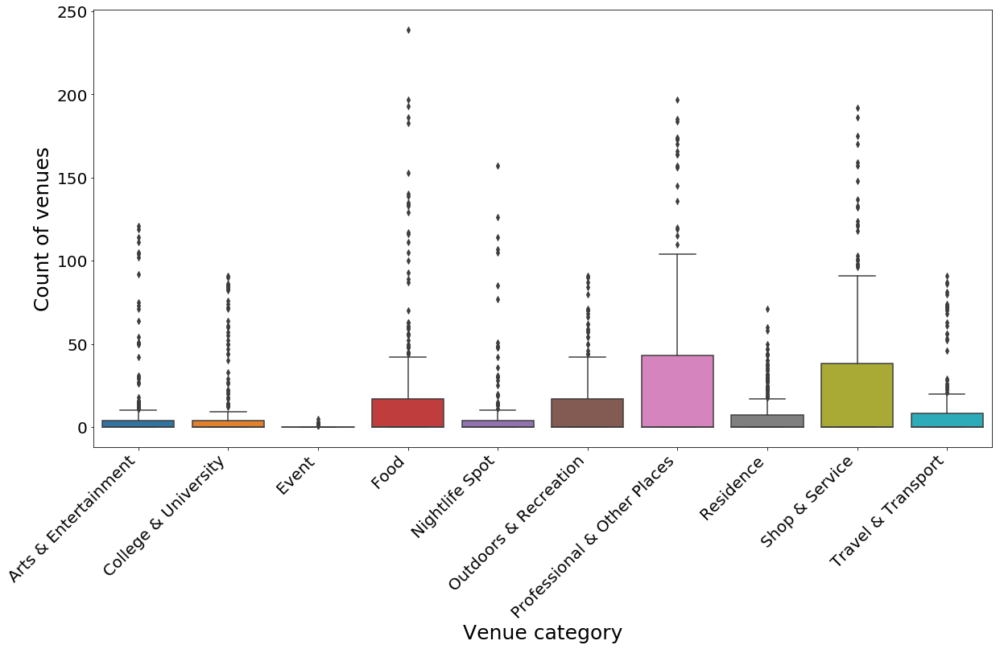

In [104]:
plt.figure(figsize=(20, 10))
plt.xticks(rotation='vertical')
sns.boxplot

ax = sns.boxplot(data = stations_venues_df)
ax.set_ylabel('Count of venues', fontsize=25)
ax.set_xlabel('Venue category', fontsize=25)
ax.tick_params(labelsize=20)
plt.xticks(rotation=45, ha='right')

plt.show()

The figure shows the distribution of main venue categories over the entire street frame.It can be observed that shops , services and professional work places are predominant in the vicinity of a 1km radius.There are quite the number of food places and transport aswell.

In [105]:
streets_venues_df.drop('Event', 1, inplace=True)

In [106]:
categories_list = list(filter(lambda x: x[0] != 'Event', categories_list))

In [107]:
from sklearn.preprocessing import MinMaxScaler

X = streets_venues_df.values[:,4:]
cluster_dataset = MinMaxScaler().fit_transform(X)

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [108]:
cluster_df = pd.DataFrame(cluster_dataset)
cluster_df.columns = [c[0] for c in categories_list]
cluster_df.head()

,Arts & Entertainment,College & University,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
0,0.041322,0.065934,0.050209,0.038217,0.098901,0.248731,0.084507,0.260417,0.087912
1,0.041322,0.197802,0.054393,0.025478,0.219780,0.208122,0.070423,0.187500,0.109890
2,0.115702,0.241758,0.121339,0.038217,0.318681,0.522843,0.309859,0.416667,0.153846
3,0.123967,0.186813,0.217573,0.089172,0.461538,0.451777,0.394366,0.359375,0.197802
4,0.256198,0.153846,0.439331,0.191083,0.263736,0.609137,0.338028,0.442708,0.780220


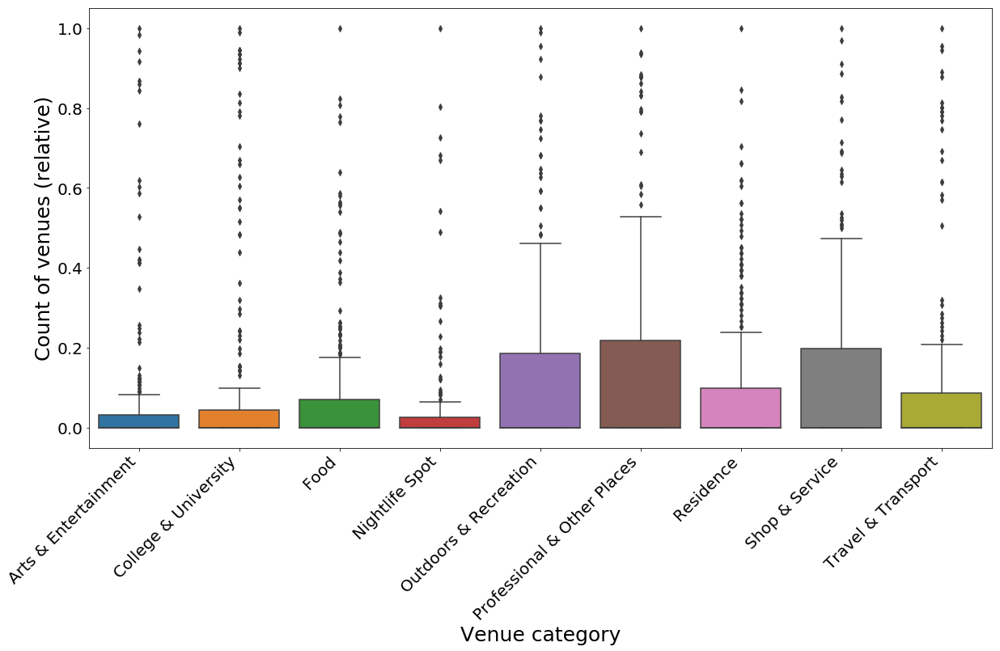

In [109]:
plt.figure(figsize=(20, 10))
#plt.xticks(rotation='vertical')
sns.boxplot

ax = sns.boxplot(data = cluster_df)
ax.set_ylabel('Count of venues (relative)', fontsize=25)
ax.set_xlabel('Venue category', fontsize=25)
ax.tick_params(labelsize=20)
plt.xticks(rotation=45, ha='right')

plt.show()

The above figure shows normalized data in a range of 0 to 1.Though none of the values fall beyond 0.2 in occurence , it is only an expected result for a 1km radius vicinity.

# k-Means Clustering

Let us cluster the localities into 5 recommendable segments

In [214]:
#Distribute in 5 Clusters

# set number of clusters
kclusters = 5

london_grouped_clustering = lon_grouped.drop('Locality', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:50]

array([1, 3, 3, 1, 3, 0, 4, 0, 4, 2, 0, 4, 3, 0, 3, 0, 3, 0, 1, 4, 4, 3,
       0, 2, 0, 3, 0, 2, 2, 3, 0, 0, 4, 0, 3, 1, 4, 2, 4, 0, 0, 0, 4, 0,
       2, 4, 0, 4, 4, 0], dtype=int32)

In [215]:
london_grouped_clustering=new_df
london_grouped_clustering.head()

,Locality,Avg_Price,latitude,longitude,Cluster Labels
4,ABBEY GARDENS,2767950.0,53.818777,-1.607672,1
13,ABBEY TRADING POINT,3000000.0,49.181792,-2.079974,3
51,ABINGDON VILLAS,2816000.0,51.497928,-0.194857,3
118,ADMIRAL SQUARE,2700000.0,51.476244,-0.180157,1
138,AINGER ROAD,2787500.0,51.541199,-0.158823,3


In [193]:
london_grouped_clustering.shape

(414, 4)

In [194]:
new_df.shape

(414, 4)

In [197]:
london_grouped_clustering['Cluster Labels'] = kmeans.labels_



In [217]:
# merge london_grouped with london_data to add latitude/longitude for each neighborhood
london_grouped_clustering = london_grouped_clustering.join(venues_sorted.set_index('Street'), on='Locality')



In [218]:
london_grouped_clustering.head() # check the last columns!

,Locality,Avg_Price,latitude,longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,ABBEY GARDENS,2767950.0,53.818777,-1.607672,1,Pub,Historic Site,Deli / Bodega,Outlet Store,Coffee Shop,History Museum,Discount Store,Supermarket,Pet Store,Optical Shop
13,ABBEY TRADING POINT,3000000.0,49.181792,-2.079974,3,Supermarket,Hotel,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory
51,ABINGDON VILLAS,2816000.0,51.497928,-0.194857,3,Café,Italian Restaurant,Hotel,Bakery,Pub,Modern European Restaurant,Sushi Restaurant,Garden,Cupcake Shop,Burger Joint
118,ADMIRAL SQUARE,2700000.0,51.476244,-0.180157,1,Pub,Hotel,Italian Restaurant,Restaurant,Spa,Café,Furniture / Home Store,Modern European Restaurant,Gastropub,Middle Eastern Restaurant
138,AINGER ROAD,2787500.0,51.541199,-0.158823,3,Pub,Café,Coffee Shop,Italian Restaurant,Asian Restaurant,Furniture / Home Store,Scenic Lookout,Park,Market,Greek Restaurant


In [220]:
# Create Map

map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_grouped_clustering['latitude'], london_grouped_clustering['longitude'], london_grouped_clustering['Locality'], london_grouped_clustering['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [221]:
london_grouped_clustering.loc[london_grouped_clustering['Cluster Labels'] == 0, london_grouped_clustering.columns[[1] + list(range(5, london_grouped_clustering.shape[1]))]].head()

,Avg_Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
146,2.022500e+06,Construction & Landscaping,Harbor / Marina,Other Repair Shop,Fish & Chips Shop,Zoo Exhibit,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor
197,2.096667e+06,Baseball Field,Vietnamese Restaurant,Breakfast Spot,Café,Skating Rink,Mexican Restaurant,Park,Baseball Stadium,Salon / Barbershop,Rock Club
413,2.000000e+06,Farm,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant
554,2.150000e+06,Grocery Store,Pub,Indian Restaurant,Park,Bakery,Coffee Shop,Mediterranean Restaurant,Fish & Chips Shop,Bar,Middle Eastern Restaurant
673,2.143471e+06,Tapas Restaurant,Grocery Store,Tram Station,Park,Zoo Exhibit,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop


In [222]:
london_grouped_clustering.loc[london_grouped_clustering['Cluster Labels'] == 1, london_grouped_clustering.columns[[1] + list(range(5, london_grouped_clustering.shape[1]))]].head()

,Avg_Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,2767950.0,Pub,Historic Site,Deli / Bodega,Outlet Store,Coffee Shop,History Museum,Discount Store,Supermarket,Pet Store,Optical Shop
118,2700000.0,Pub,Hotel,Italian Restaurant,Restaurant,Spa,Café,Furniture / Home Store,Modern European Restaurant,Gastropub,Middle Eastern Restaurant
837,2745000.0,Hotel,Gym / Fitness Center,Diner,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory
1545,2650000.0,Italian Restaurant,Burger Joint,Pizza Place,Café,Bakery,Japanese Restaurant,Shopping Plaza,Restaurant,Peruvian Restaurant,Juice Bar
2106,2655000.0,Gym,Indian Restaurant,Train Station,Fast Food Restaurant,Gym / Fitness Center,Platform,Falafel Restaurant,Electronics Store,English Restaurant,Entertainment Service


In [223]:
london_grouped_clustering.loc[london_grouped_clustering['Cluster Labels'] == 2, london_grouped_clustering.columns[[1] + list(range(5, london_grouped_clustering.shape[1]))]].head()

,Avg_Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
406,2250000.0,Italian Restaurant,Pub,Restaurant,Clothing Store,Hotel,Indian Restaurant,English Restaurant,Chinese Restaurant,Café,Garden
1102,2340000.0,Sporting Goods Shop,Bowling Alley,Gas Station,Zoo Exhibit,Filipino Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory
1215,2208500.0,Hotel,Coffee Shop,Café,Pizza Place,Restaurant,Chinese Restaurant,Gastropub,Bar,Salad Place,Pub
1253,2217000.0,Pub,Breakfast Spot,Lake,French Restaurant,Bakery,Train Station,Coffee Shop,Chinese Restaurant,Brewery,Fish & Chips Shop
1558,2177900.0,Bus Stop,Café,Train Station,Furniture / Home Store,Rugby Pitch,Fast Food Restaurant,Zoo Exhibit,Event Space,Exhibit,Eye Doctor


In [224]:
london_grouped_clustering.loc[london_grouped_clustering['Cluster Labels'] == 3, london_grouped_clustering.columns[[1] + list(range(5, london_grouped_clustering.shape[1]))]].head()

,Avg_Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,3000000.0,Supermarket,Hotel,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory
51,2816000.0,Café,Italian Restaurant,Hotel,Bakery,Pub,Modern European Restaurant,Sushi Restaurant,Garden,Cupcake Shop,Burger Joint
138,2787500.0,Pub,Café,Coffee Shop,Italian Restaurant,Asian Restaurant,Furniture / Home Store,Scenic Lookout,Park,Market,Greek Restaurant
484,2964927.0,Gym / Fitness Center,Burrito Place,Community Center,Tennis Court,Chinese Restaurant,Szechuan Restaurant,Sandwich Place,Supermarket,Bakery,Bookstore
640,2950000.0,Pub,Coffee Shop,Bakery,Pizza Place,Grocery Store,Park,Hotel,Bookstore,Ice Cream Shop,Indian Restaurant


In [225]:
london_grouped_clustering.loc[london_grouped_clustering['Cluster Labels'] == 4, london_grouped_clustering.columns[[1] + list(range(5, london_grouped_clustering.shape[1]))]].head()

,Avg_Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
196,2450000.0,Café,Coffee Shop,Indian Restaurant,Pub,Restaurant,Bar,Brewery,French Restaurant,Museum,Fish & Chips Shop
391,2435000.0,Pub,Grocery Store,Garden,Pizza Place,Gym / Fitness Center,Cocktail Bar,English Restaurant,Japanese Restaurant,Diner,Plaza
422,2400000.0,Bar,Pub,Casino,Nightclub,Food Stand,Farmers Market,Ethiopian Restaurant,Forest,Event Space,Exhibit
855,2375000.0,Indie Movie Theater,Thai Restaurant,Pub,Restaurant,Pizza Place,Coffee Shop,Park,Farmers Market,Food & Drink Shop,Nature Preserve
981,2480000.0,Pub,Coffee Shop,Hotel,Chinese Restaurant,Thai Restaurant,Grocery Store,Italian Restaurant,Latin American Restaurant,Bed & Breakfast,Ice Cream Shop


We have obtained 5 clusters of places based on their pricing .Let us now compare them based on the categories we obtained above and observe which cluster has the best amenities.

In [114]:
# set number of clusters
kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(cluster_df)

kmeans_labels = kmeans.labels_
# Change label numbers so they go from highest scores to lowest
replace_labels = {0:2, 1:0, 2:3, 3:1 ,4:1,5:3}
for i in range(len(kmeans_labels)):
    kmeans_labels[i] = replace_labels[kmeans_labels[i]]

stations_clusters_df = stations_venues_df.copy()
stations_clusters_df['Cluster'] = kmeans_labels
stations_clusters_minmax_df = cluster_df.copy()
stations_clusters_minmax_df['Cluster'] = kmeans_labels
stations_clusters_minmax_df['English name'] = stations_df['English name']
stations_clusters_minmax_df['Coordinates'] = stations_df['Coordinates']

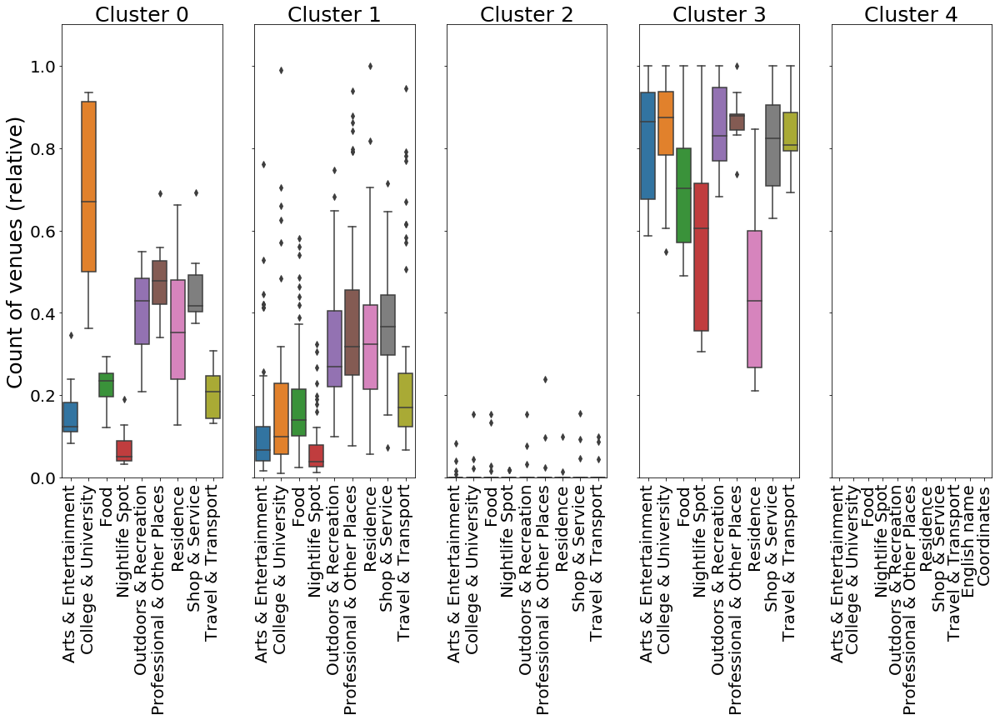

In [115]:
import matplotlib.ticker as ticker

fig, axes = plt.subplots(1,kclusters, figsize=(20, 10), sharey=True)

axes[0].set_ylabel('Count of venues (relative)', fontsize=25)
#plt.set_xlabel('Venue category', fontsize='x-large')

for k in range(kclusters):
    #Set same y axis limits
    axes[k].set_ylim(0,1.1)
    axes[k].xaxis.set_label_position('top')
    axes[k].set_xlabel('Cluster ' + str(k), fontsize=25)
    axes[k].tick_params(labelsize=20)
    plt.sca(axes[k])
    plt.xticks(rotation='vertical')
    sns.boxplot(data = stations_clusters_minmax_df[stations_clusters_minmax_df['Cluster'] == k].drop('Cluster',1), ax=axes[k])

plt.show()

As it can be clearly observed clusters 0,1 nand 3 have most of the amenities.Cluster 0 has a larger number of educational institutions in the vicinity , a residential place with  moderately appropriate facilities.Cluster 1 has quite a large number of outliers and moderately placed amenities.Cluster 3 is observed to have higher counts of all categories though their mean and quartile ranges are smaller.

Hence , the localities have been clustered , priced and observed and the following results have been drawn.

## Results :
As per the scope of this project the following results were observed :
1.	Average house considered for the project is between £2,000,000 - £3,000,000 which was determined based on mean price of £2,202,125
2.	From the pricing statistics , it can be observed that 50% of the localities have a mean price of 2,400,000 pounds and a major 75% make up for a price value of 2,650,000 pounds which is a good price representative range.
3.	The streets of London were segmented into five clusters.
         A.	Cluster 0 – approximate price range (2,000,000-2,150,000)
         B.	Cluster 1 – approximate price range (2,650,000-2,800,000)
         C.	Cluster 2 – approximate price range (2,150,000-2,350,000)
         D.	Cluster 3 – approximate price range (2,810,000-3,000,000)
         E.	Cluster 4 – approximate price range (2,350,000-2,500,000)
4.	All clusters had ample restaurants and recreational facilities in the vicinity.
5.	The clusters were viewed on the map.
6.	With respect to proximity of prominent amenities in each location , from a general perspective it can be observed that cluster 0 ,cluster 1 and cluster 3 have the most prominent number of venue categories.
7.	cluster 0 has the least pricing , more educational institutions , preferable transportation and professional locations in the vicinity. cluster 1 has a large number of outliers with a comparatively small range of facilities. However , it is still a preferred location for residence and has a comparatively higher pricing range. cluster 3 has the highest pricing range in the average scale , however it is still affordable and has enumerable benefits and facilities with the highest occurrence of amenities - educational institutions, food , nightlife, transportation and highest number of residencies aswell.
8.	The clusters were compared in order to draw inferences on the best cluster using exploratory analysis - box plots


## DISCUSSION:
Despite the economic crisis , from the data acquired , it can be observed that there is good affordable housing within a range of about £2,000,000 - £3,000,000 in London with almost 414 streets predominantly falling in the range. In order to increase the stake of preferences the venues in the vicinity of each street were viewed and it can be observed that there are plenty of restaurants and eateries in the vicinity of each street.When it comes to schools,local stores , work place, transportation etc , which are extremely important to family residents it can be observed that cluster 3 has the most number and occurence of various amenities followed by cluster 0.In terms of pricinh however cluster 0 is cheaper than cluster 3. This helps with deriving conclusions on the order of precedence of clusters as follows:
In terms of pricing ,order of precedence would be :
1. cluster 0
2. custer  1
3. cluster 3
In terms of pricing and amenities combined :
1. cluster 3
2. cluster 0
3. cluster 1

It depends on the prefernce of the customer , However places like Croydon, Colindale, Bromley, Hornchurch, Woolwich, Leytonstone, Brentford and Crystal Palace belonging to these above mentioned clusters can definitely be recommended.





## CONCLUSION:

The scope of the project was to address the question of preferable housing suggestions to real estate agencies and real estate clientele interested in purchasing their own independent homes. In lieu with the expectation , localities with affordable residences were clustered , visualized and the ones with best amenities were deduced in order to render valuable suggestions to the target audience. Through the course of the project it was observed that comparatively cheaper and good quality homes are available in London and just that one needs to be on the lookout for it. The most dominant cluster was  cluster 3 followed by cluster 0 while taking both amenities and pricing into considertion and some of the most predominant localities were found to be  Croydon, Colindale, Bromley, Hornchurch, Woolwich, Leytonstone, Brentford and Crystal Palace.         
         Thus , I believe the project has addressed 60% of the housing issue. However there is a broader scope for further in depth analysis to suggest housing not just based on vicinity and pricing but also on the type of housing ,transportation, design and alternatives to amazing and yet affordable architectural constructs such as rooftop housing , bridged housing etc with more advanced exploratory analysis and machine learning techniques.


# THANK YOU